# HR Analytics Project

## Import necessary libaraies

In [84]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

### Project Description

Every year a lot of companies hire a number of employees. The companies invest time and money in training those employees, not just this but there are training programs within the companies for their existing employees as well. The aim of these programs is to increase the effectiveness of their employees. But where HR Analytics fit in this? and is it just about improving the performance of employees?

**HR Analytics**
Human resource analytics (HR analytics) is an area in the field of analytics that refers to applying analytic processes to the human resource department of an organization in the hope of improving employee performance and therefore getting a better return on investment. HR analytics does not just deal with gathering data on employee efficiency. Instead, it aims to provide insight into each process by gathering data and then using it to make relevant decisions about how to improve these processes.

**Attrition in HR**
Attrition in human resources refers to the gradual loss of employees overtime. In general, relatively high attrition is problematic for companies. HR professionals often assume a leadership role in designing company compensation programs, work culture, and motivation systems that help the organization retain top employees.

How does Attrition affect companies? and how does HR Analytics help in analyzing attrition? We will discuss the first question here and for the second question, we will write the code and try to understand the process step by step.

**Attrition affecting Companies**
A major problem in high employee attrition is its cost to an organization. Job postings, hiring processes, paperwork, and new hire training are some of the common expenses of losing employees and replacing them. Additionally, regular employee turnover prohibits your organization from increasing its collective knowledge base and experience over time. This is especially concerning if your business is customer-facing, as customers often prefer to interact with familiar people. Errors and issues are more likely if you constantly have new workers.

## Import dataset

In [85]:
# Importing the dataset into Dataframe
df = pd.read_csv('WA_Fn-UseC_-HR-Employee-Attrition.csv')

In [86]:
print('The no. of rows',df.shape[0])
print('The no. of columns',df.shape[1])

pd.set_option('display.max_columns', None) # This will enable us to see truncated columns
df.head()

The no. of rows 1470
The no. of columns 35


,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


 In this HR dataset we have 1470 rows and 35 columns.

In [87]:
# Checking the columns of the dataset
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [88]:
# Checking column name, its datatype and its count
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

Out of 35 we have 9 features with Object datatypes and rest are int64 types. Non-null count is same for all Columns, so it seem that it contain No missing value.

In [89]:
# Checking the missing value in the dataset
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

We can observe that there are no missing value in the dataset.

In [90]:
# Checking the duplicates values
df.duplicated().sum()

0

This dataset has no duplicates.

In [91]:
# Checking the unique value of each column
df.nunique().to_frame('No. of unique value')

,No. of unique value
Age,43
Attrition,2
BusinessTravel,3
DailyRate,886
Department,3
DistanceFromHome,29
Education,5
EducationField,6
EmployeeCount,1
EmployeeNumber,1470


In [92]:
# Checking the value counts of each columns
for i in df.columns:
    print(df[i].value_counts())
    print('\n')

Age
35    78
34    77
36    69
31    69
29    68
32    61
30    60
33    58
38    58
40    57
37    50
27    48
28    48
42    46
39    42
45    41
41    40
26    39
44    33
46    33
43    32
50    30
25    26
24    26
49    24
47    24
55    22
51    19
53    19
48    19
54    18
52    18
22    16
56    14
23    14
58    14
21    13
20    11
59    10
19     9
18     8
60     5
57     4
Name: count, dtype: int64


Attrition
No     1233
Yes     237
Name: count, dtype: int64


BusinessTravel
Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: count, dtype: int64


DailyRate
691     6
408     5
530     5
1329    5
1082    5
       ..
650     1
279     1
316     1
314     1
628     1
Name: count, Length: 886, dtype: int64


Department
Research & Development    961
Sales                     446
Human Resources            63
Name: count, dtype: int64


DistanceFromHome
2     211
1     208
10     86
9      85
3      84
7      84
8      80
5      65
4      64
6

 * StandardHours, EmployeeCount and Over18 contain only one value in all of rows. It means they contain one unique value. We can also seem that EmployeeNumber has only count series of 1 to 1470. There are no used. So we can drop these columns.
 
 * Among all Numeric Variables 'Education','EnvironmentSatisfaction', 'JobInvolvement',
 'JobSatisfaction', 'RelationshipSatisfaction', 'PerformanceRating', 'WorkLifeBalance' are ordinal variable. Unique range of all these ordinal Variable need to check.

In [93]:
# Drop useless columns
df = df.drop(columns=['EmployeeCount','EmployeeNumber','StandardHours','Over18'],axis=1)

df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Yes,15,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Yes,11,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,No,12,3,4,1,6,3,3,2,2,2,2


In [94]:
# As we have 35 Columns Lets sort Columns by their datatype
df.columns.to_series().groupby(df.dtypes).groups

{int64: ['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager'], object: ['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'OverTime']}

**These Ordinal features come with the following label encoding:**

 * Education: 1- 'Below College' , 2 -'College', 3 -'Bachelor', 4- 'Master' ,5 -'Doctor'
 * EnvironmentSatisfaction: 1- 'Low', 2- 'Medium', 3 -'High', 4- 'Very High'
 * JobInvolvement: 1 -'Low', 2- 'Medium', 3- 'High', 4- 'Very High'
 * JobSatisfaction: 1- 'Low', 2- 'Medium', 3- 'High', 4 -'Very High'
 * PerformanceRating: 1- 'Low', 2- 'Average', 3 -'Good', 4- 'Excellent', 5- 'Outstanding'
 * RelationshipSatisfaction: 1- 'Low', 2- 'Medium', 3- 'High', 4- 'Very High'
 * WorkLifeBalance: 1- 'Bad', 2- 'Good', 3- 'Better', 4- 'Best'      

**We create Sub-categories of numerical, categorical and ordinal categorical columns.**

In [95]:
categorical = ['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 
               'MaritalStatus', 'OverTime']
    
ord_cat =     ['Education','EnvironmentSatisfaction','JobInvolvement','JobSatisfaction',
              'PerformanceRating','RelationshipSatisfaction','WorkLifeBalance']

numerical =   ['Age','DailyRate','DistanceFromHome','HourlyRate','MonthlyIncome','MonthlyRate',
               'NumCompaniesWorked','PercentSalaryHike','JobLevel','StockOptionLevel','TotalWorkingYears',
               'TrainingTimesLastYear','YearsAtCompany','YearsInCurrentRole','YearsSinceLastPromotion',
               'YearsWithCurrManager']

Few columns which we not understand that which is right place like EmployeeCount, EmployeeNumber, JobLevel, NumCompaniesWorked, StandardHours, StockOptionLevel. So check it latter what can we do.

In [96]:
# Checking the value counts of target columns
df['Attrition'].value_counts()

Attrition
No     1233
Yes     237
Name: count, dtype: int64

We can observe that target columns has two class. So it has binary classification problem. In this we notic that class imbalanced. we solve this problem using

### Distribution of dataset

In [97]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,14313.103401,2.693197,15.209524,3.153741,2.712245,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,7117.786044,2.498009,3.659938,0.360824,1.081209,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,0.000000,11.000000,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,12.000000,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,14235.500000,2.000000,14.000000,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,20461.500000,4.000000,18.000000,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,26999.000000,9.000000,25.000000,4.000000,4.000000,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


 * Minimum Empolyee Age is 18 and Maximum age of employee 60.
 * Average distance from home is 9.1 KM. It means that most of employee travel atleast 18 KM in day from home to office.
 * On Average performance Rating of employees is 3.163 with min value 3.0. This Means that performance of most of employee is 'Good'.This implies that Attrition of Employee with 'Outstanding' or 5 rating need to investigate.
 * 50% of Employees has worked atleast 2 companies previously.
 * For Monthly Income,Monthly Rate by looking at 50% and max column we can say outliers exist in this feature.
 * By looking at Mean and Median we see that some of the features are skew in nature.
 * For ordinal features and categorical features statstical terminology of mean, median, std deviation doesnot make sense.

In [98]:
# Checking education level vs department count
pd.crosstab(df.Education,df.Department,margins=True)

Department,Human Resources,Research & Development,Sales,All
Education,,,,
1,5,115,50,170
2,13,182,87,282
3,27,379,166,572
4,15,255,128,398
5,3,30,15,48
All,63,961,446,1470


It's seems which department is related with education.

In [99]:
# Checking education level vs department and attrition count
pd.crosstab(df.Education,[df.Department,df.Attrition],margins=True)

Department Human Resources     Research & Development      Sales       All
Attrition               No Yes                     No  Yes    No Yes      
Education                                                                 
1                        4   1                     96   19    39  11   170
2                       10   3                    159   23    69  18   282
3                       23   4                    323   56   127  39   572
4                       12   3                    223   32   105  23   398
5                        2   1                     27    3    14   1    48
All                     51  12                    828  133   354  92  1470

Checking the Attrition of Education and department will related. 

In [100]:
# Checking count jobrole vs department
pd.crosstab([df.JobRole],[df.Department],margins=True)

Department,Human Resources,Research & Development,Sales,All
JobRole,,,,
Healthcare Representative,0,131,0,131
Human Resources,52,0,0,52
Laboratory Technician,0,259,0,259
Manager,11,54,37,102
Manufacturing Director,0,145,0,145
Research Director,0,80,0,80
Research Scientist,0,292,0,292
Sales Executive,0,0,326,326
Sales Representative,0,0,83,83


We observe that which department has frequency of jobrole.

In [101]:
# Checking count of jobrole vs department with attrition
pd.crosstab([df.JobRole,df.Department],[df.Attrition],margins=True)

Attrition                                           No  Yes   All
JobRole                   Department                             
Healthcare Representative Research & Development   122    9   131
Human Resources           Human Resources           40   12    52
Laboratory Technician     Research & Development   197   62   259
Manager                   Human Resources           11    0    11
                          Research & Development    51    3    54
                          Sales                     35    2    37
Manufacturing Director    Research & Development   135   10   145
Research Director         Research & Development    78    2    80
Research Scientist        Research & Development   245   47   292
Sales Executive           Sales                    269   57   326
Sales Representative      Sales                     50   33    83
All                                               1233  237  1470

We observe that which department has frequency of jobrole with Attrition.

In [102]:
# Checking count of attrition vs gender
pd.crosstab([df.Attrition],[df.Gender],margins=True)

Gender,Female,Male,All
Attrition,,,
No,501,732,1233
Yes,87,150,237
All,588,882,1470


We observe that which gender has more attrition.

In [103]:
# Checking count of dpeartment vs gender
pd.crosstab([df.Department],[df.Gender],margins=True)

Gender,Female,Male,All
Department,,,
Human Resources,20,43,63
Research & Development,379,582,961
Sales,189,257,446
All,588,882,1470


We observe that department which has male and female.

In [104]:
# Checking count of educaitonfield vs attrition
pd.crosstab([df.EducationField],[df.Attrition],margins=True)

Attrition,No,Yes,All
EducationField,,,
Human Resources,20,7,27
Life Sciences,517,89,606
Marketing,124,35,159
Medical,401,63,464
Other,71,11,82
Technical Degree,100,32,132
All,1233,237,1470


We observe that which EducationField has more attirition or less.

In [105]:
# Checking count of PerformanceRating vs attrition
pd.crosstab([df.PerformanceRating],[df.Attrition],margins=True)

Attrition,No,Yes,All
PerformanceRating,,,
3,1044,200,1244
4,189,37,226
All,1233,237,1470


We observe that Performance of ATtrition or Non Attrition.

# Data visualization

## Univarite Analysis

Attrition
No     1233
Yes     237
Name: count, dtype: int64


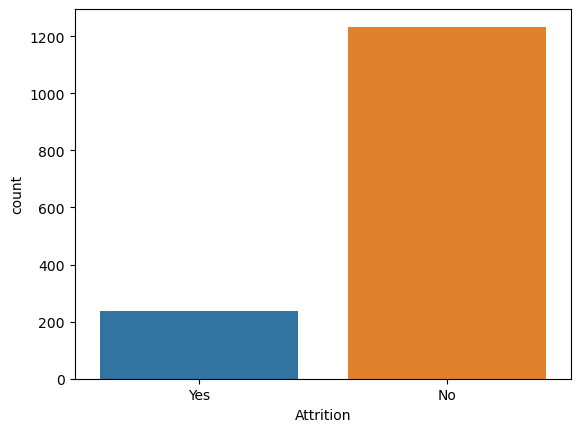

In [106]:
# Checking the count of target columns 
print(df['Attrition'].value_counts())
sns.countplot(x='Attrition',data=df)
plt.show()

We can observe that target columns has two class. So it has binary classification problem. In this we notic that class imbalanced. 

**Checking the frequency of categorical columns.**

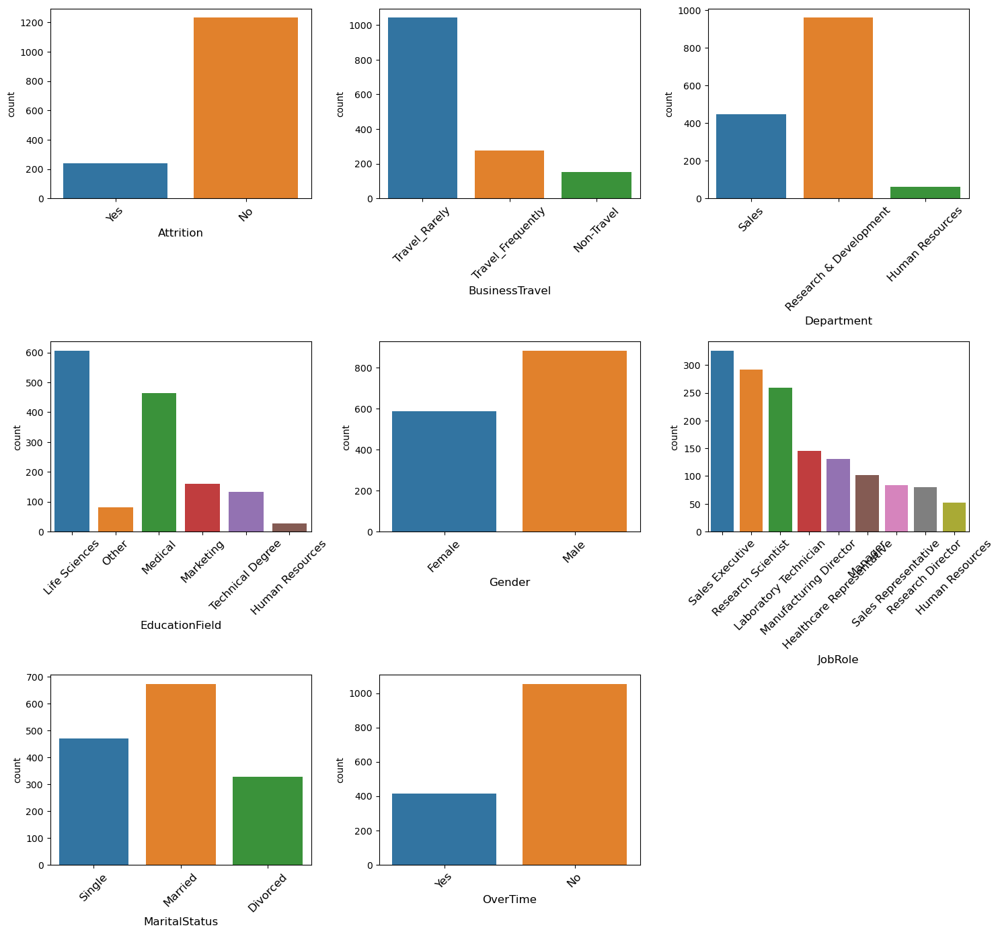

In [107]:
# checking the feequency of categorical columns using countplot
plt.figure(figsize=(15,14),facecolor='white')
plotnumber = 1

for col in categorical:
    if plotnumber<=8:
        ax = plt.subplot(3,3,plotnumber)
        sns.countplot(x=df[col])
        plt.xlabel(col,fontsize=12)
        plt.xticks(fontsize=12,rotation=45)
    plotnumber+=1
plt.tight_layout()

1. Travel Rarely are bit high is count in BusinessTravel columns.
2. Research and Development are bit high is count in Department columns.
3. Life Sciences and medical are bit high is count in EducationField columns.
3. We can observe that the total number of makes and females are almost same.
4. In column Jobrole count is decreasing order.
5. Married employee is more count in MaritalStatus columns.
6. We observe that the count is high which has no doing overtime.

**Checking the frequency of ordinal categorical columns.**

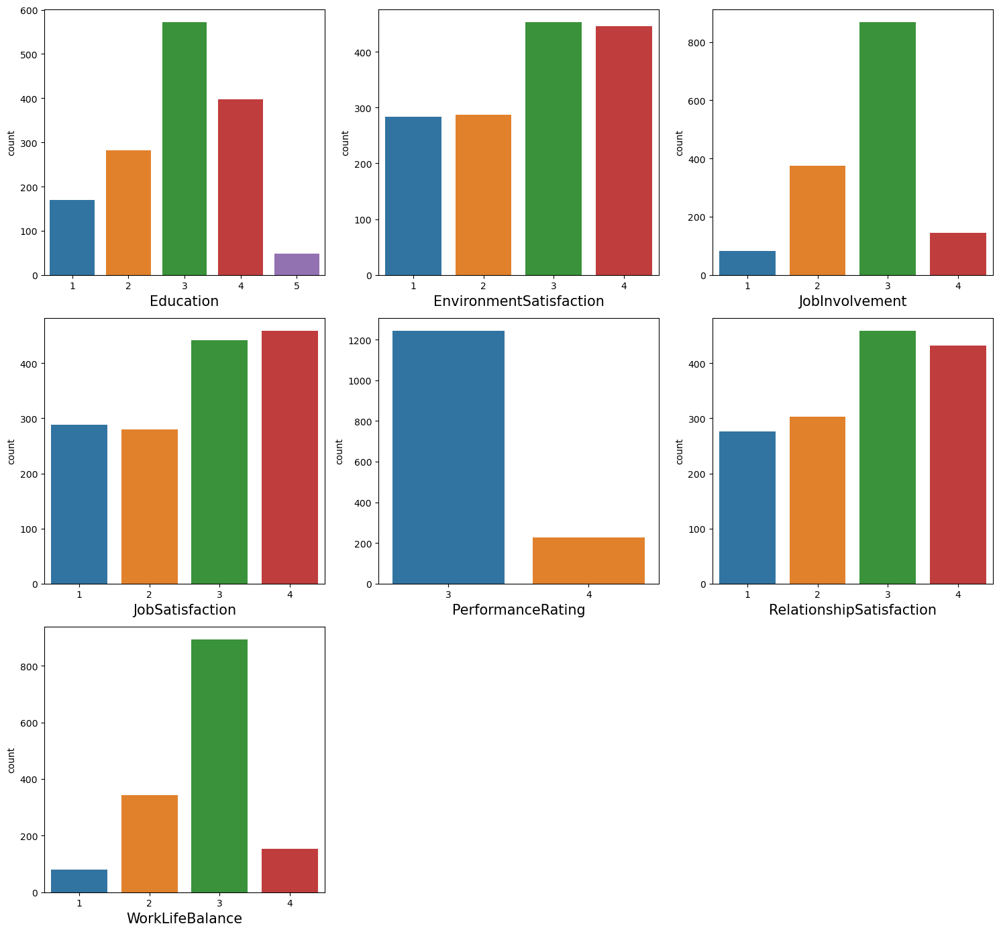

In [108]:
# checking the feequency of ordinal categorical columns using countplot
plt.figure(figsize=(15,14),facecolor='white')
plotnumber = 1

for col in ord_cat:
    if plotnumber<=8:
        ax = plt.subplot(3,3,plotnumber)
        sns.countplot(x=df[col])
        plt.xlabel(col,fontsize=15)
    plotnumber+=1
plt.tight_layout()

We observe that the count of each columns with respectively.

**Checking the data distribution of numerical columns**

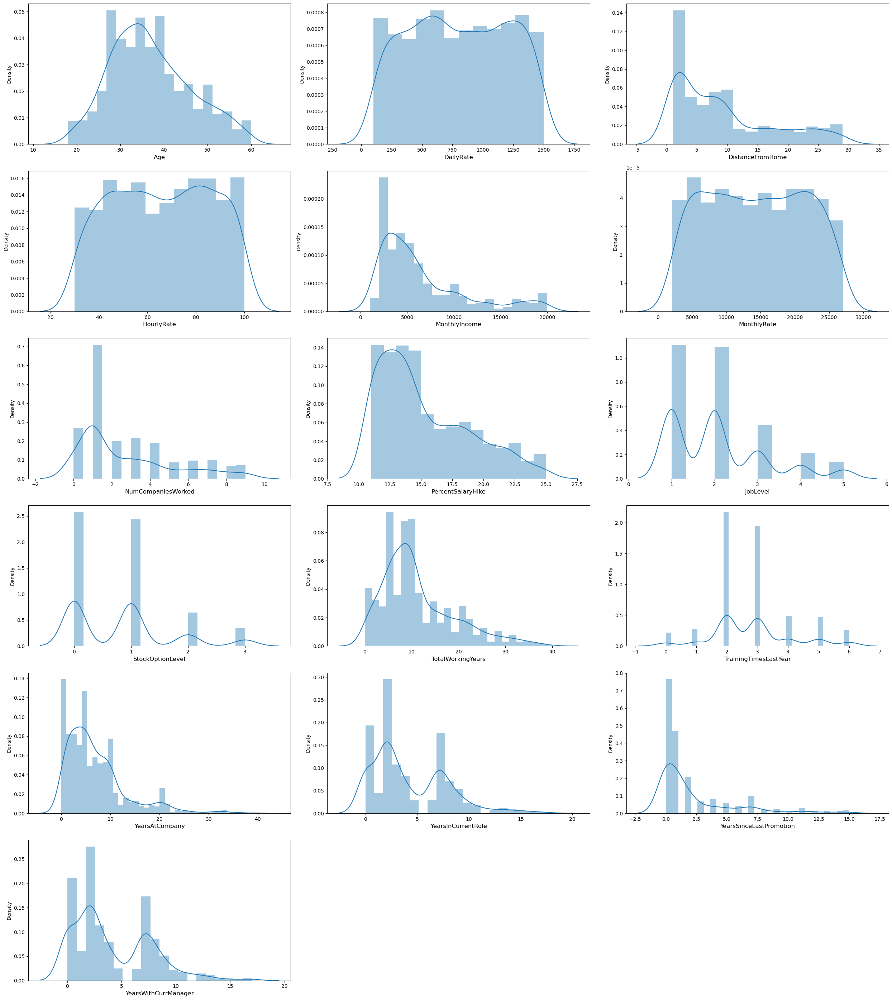

In [109]:
# Checking how to data distribution of each numerical columns using distplot
plt.figure(figsize=(25,28),facecolor='white')

plotnumber = 1

for col in numerical:
    if plotnumber<=16:
        ax = plt.subplot(6,3,plotnumber)
        sns.distplot(df[col])
        plt.xlabel(col,fontsize=12)
    plotnumber+=1
plt.tight_layout()

From the above distribution plots we can notice the data not normal is all the columns. These columns'DistanceFromHome','MonthlyIncome','NumCompaniesWorked','PercentSalaryHike','TotalWorkingYears','YearsAtCompany','YearsInCurrentRole','YearsSinceLastPromotion','YearsWithCurrManager' is skewed to the right.But there columns seems ordinal categorical columns which only 4 and 5 classes 'HourlyRate',
'JobLevel','StockOptionLevel','TrainingTimesLastYear'.

## Univariate analysis

## Features vs target

**Checking the feequency of categorical columns vs target columns**

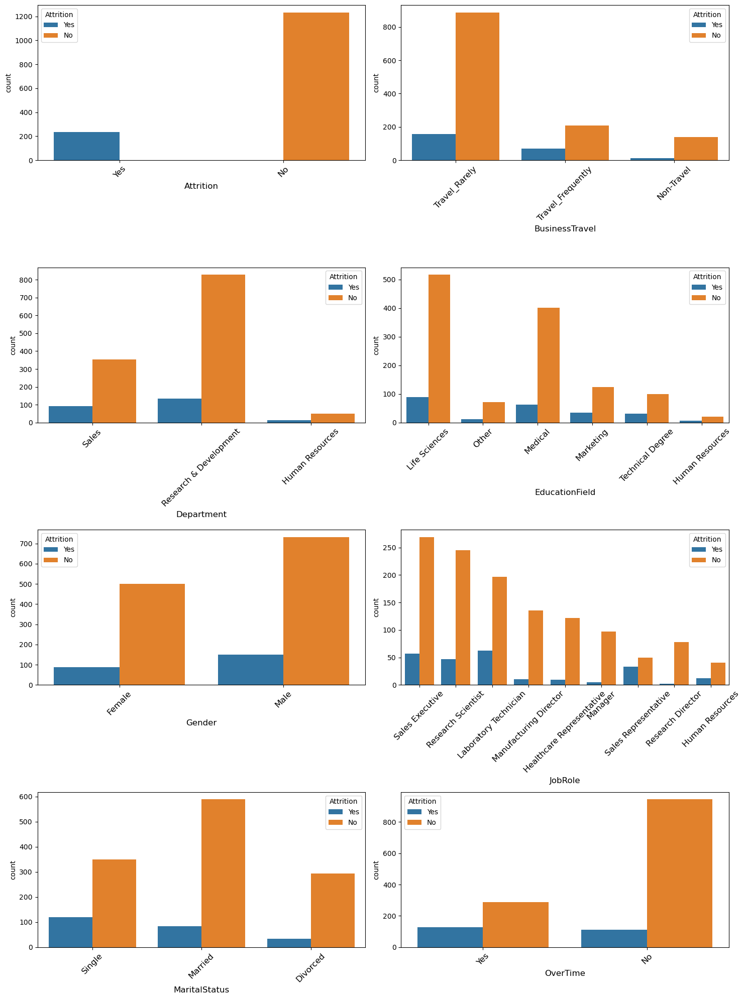

In [110]:
# checking the feequency of categorical columns vs target columns using countplot
plt.figure(figsize=(15,20),facecolor='white')
plotnumber = 1

for col in categorical:
    if plotnumber<=8:
        ax = plt.subplot(4,2,plotnumber)
        sns.countplot(x=df[col],hue=df['Attrition'])
        plt.xlabel(col,fontsize=12)
        plt.xticks(fontsize=12,rotation=45)
    plotnumber+=1
plt.tight_layout()

From the above countplot with Attrition we can notice that in each column. Employee has not attrition has very high respectively which has yes attrition.

**Checking the fequency of cat_ord columns vs target columns**

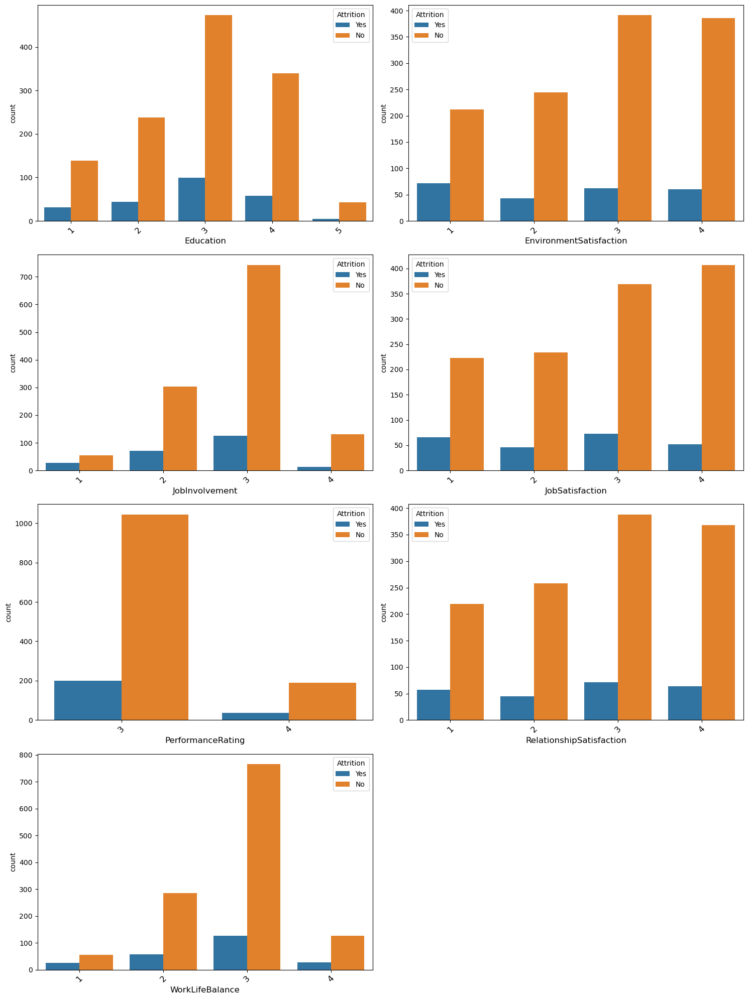

In [111]:
# checking the feequency of cat_ord columns vs target columns using countplot
plt.figure(figsize=(15,20),facecolor='white')
plotnumber = 1

for col in ord_cat:
    if plotnumber<=8:
        ax = plt.subplot(4,2,plotnumber)
        sns.countplot(x=df[col],hue=df['Attrition'])
        plt.xlabel(col,fontsize=12)
        plt.xticks(fontsize=12,rotation=45)
    plotnumber+=1
plt.tight_layout()

From the above countplot with Attrition we can notice that in each column. Employee has not attrition has very high respectively which has yes attrition.

**Checking the relationship of numerical columns vs target columns**

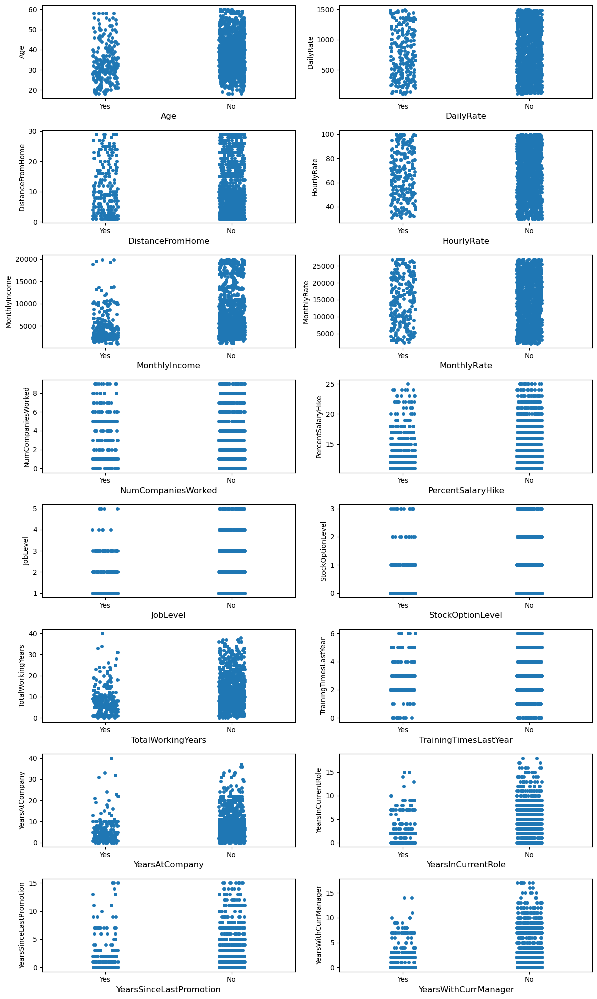

In [112]:
# checking the relationship of numerical columns vs target columns using stripplot
plt.figure(figsize=(12,20),facecolor='white')
plotnumber = 1

for col in numerical:
    if plotnumber<=16:
        ax = plt.subplot(8,2,plotnumber)
        sns.stripplot(y=df[col],x=df['Attrition'])
        plt.xlabel(col,fontsize=12)
    plotnumber+=1
plt.tight_layout()

### Features vs Features

**Checking the fequency of categorical columns vs Department columns**

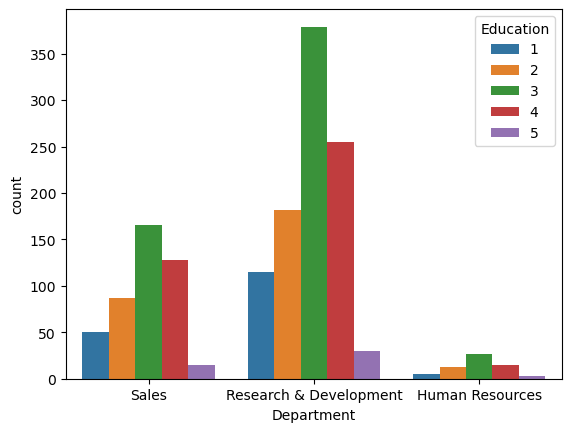

In [113]:
# Checking Department vs Education 
sns.countplot(x='Department',hue='Education',data=df)
plt.show()

We observe that Human Resources has very less contibution. and Research & Department has very high contibution.

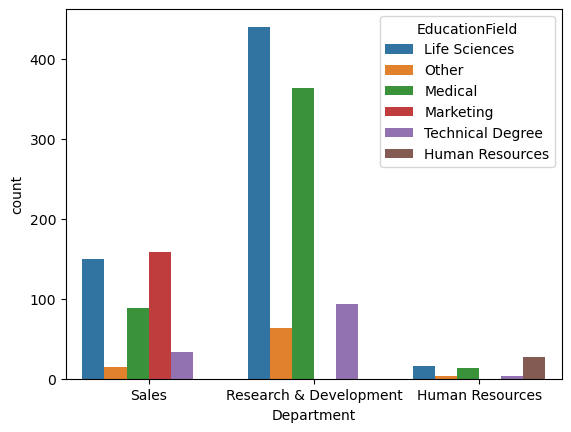

In [114]:
# Checking Department vs Educationfield
sns.countplot(x='Department',hue='EducationField',data=df)
plt.show()

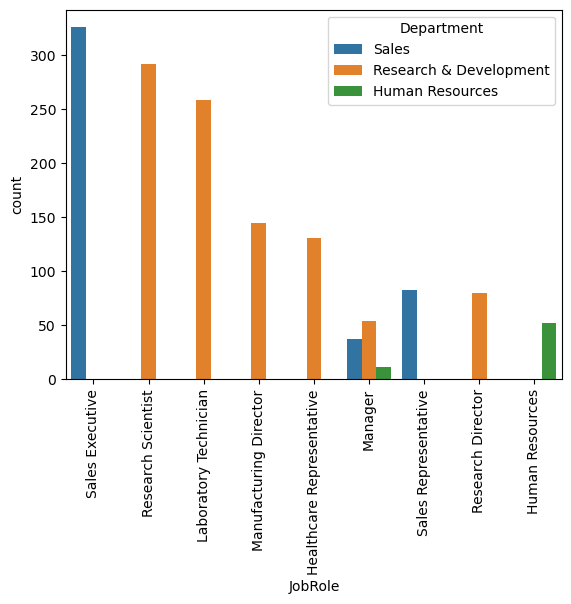

In [115]:
# Checking JobRole vs Department
sns.countplot(x='JobRole',hue='Department',data=df)
plt.xticks(rotation=90)
plt.show()

We observe that manager that contibution in all the Department.

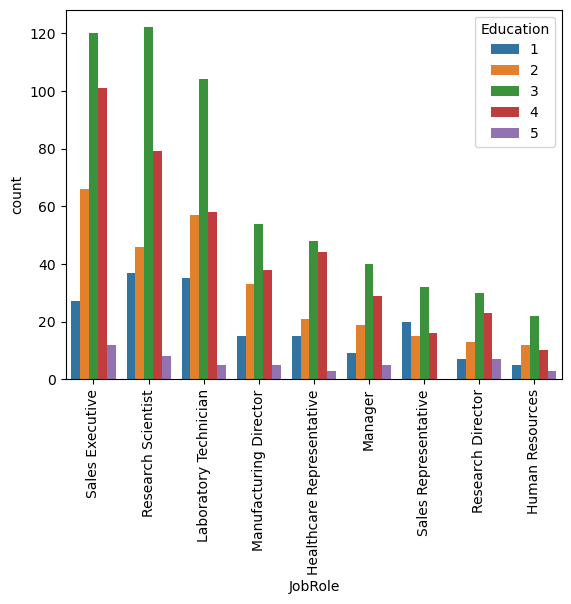

In [116]:
# JobRole vs Education
sns.countplot(x='JobRole',hue='Education',data=df)
plt.xticks(rotation=90)
plt.show()

We observe that JobRole respectively with Education has in decreasing order.

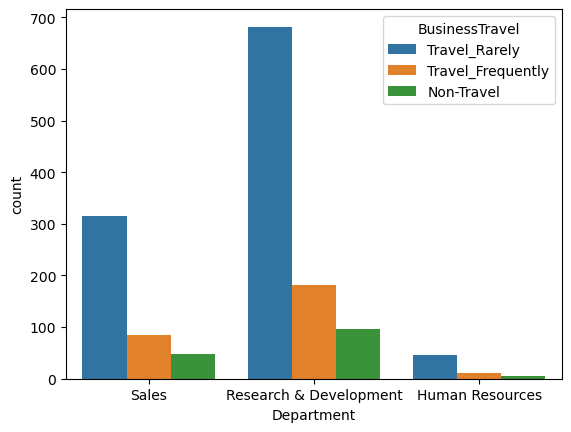

In [117]:
# Checking Department vs BusinessTravel
sns.countplot(x='Department',hue='BusinessTravel',data=df)
plt.show()

We can observe that Research & Department with Travel Rarely is high.

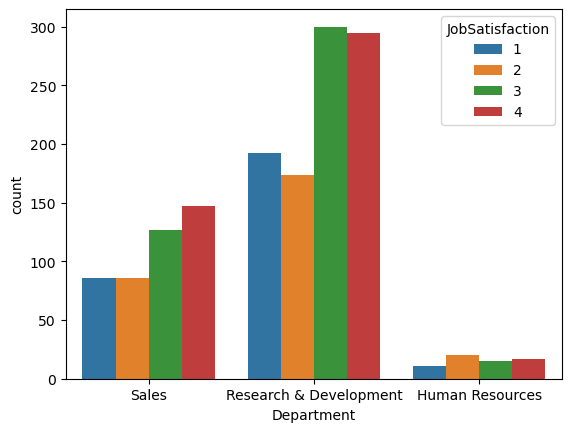

In [118]:
# Checking Department vs JobSatisfaction
sns.countplot(x='Department',hue='JobSatisfaction',data=df)
plt.show()

We can observe that Research & Department JobSatisfaction is high.

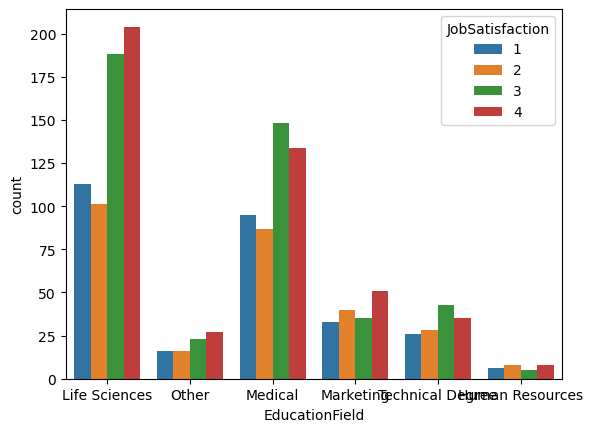

In [119]:
# Checking EducationField vs JobSatisfaction
sns.countplot(x='EducationField',hue='JobSatisfaction',data=df)
plt.show()

We observe that Life Sciences and medical and high freqiency JobSatisfaction 

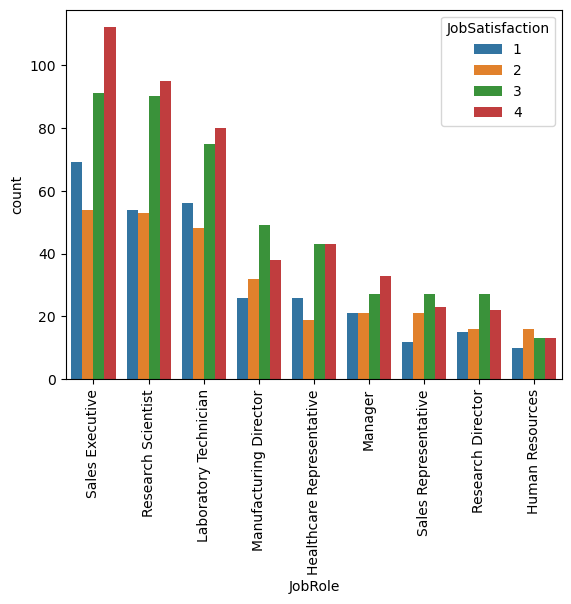

In [120]:
# Checking JobRole vs JobSatisfaction
sns.countplot(x='JobRole',hue='JobSatisfaction',data=df)
plt.xticks(rotation=90)
plt.show()

We observe that JobRole respectively with JobSatisfaction has in decreasing order.

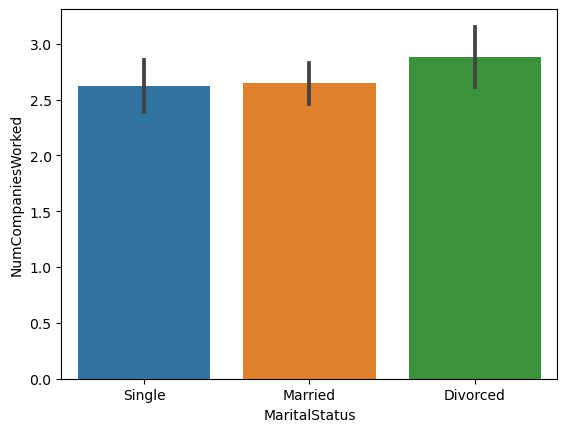

In [121]:
# Checking NumCompaniesWorked vs MaritalStatus
sns.barplot(x='MaritalStatus',y='NumCompaniesWorked',data=df)
plt.show()

There is no significant between single, married and divorced.

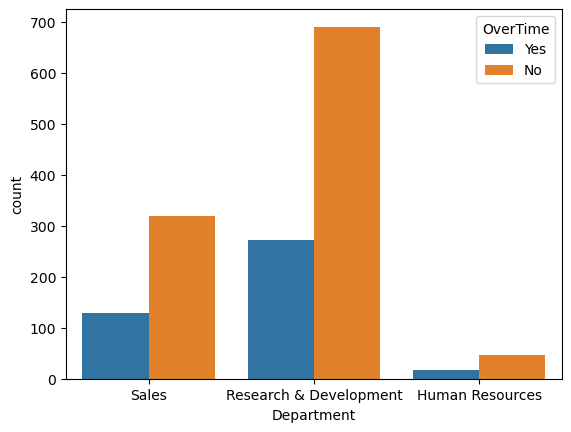

In [122]:
# Checking Department vs OverTime
sns.countplot(x='Department',hue='OverTime',data=df)
plt.show()

We obesrve that in Research & Department count is high which has not doing overtime.

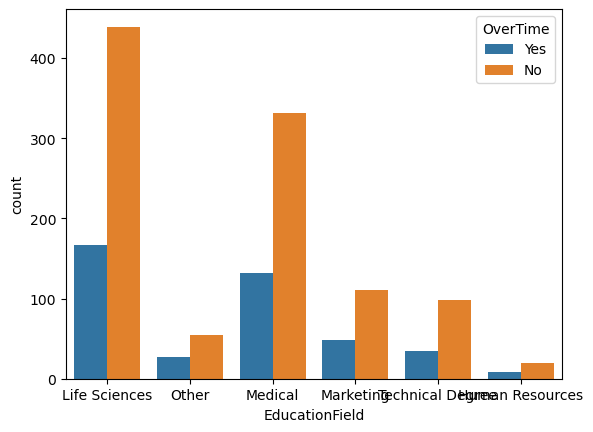

In [123]:
# Checking EducationField vs OverTime
sns.countplot(x='EducationField',hue='OverTime',data=df)
plt.show()

We can observe taht Life Sciences related has not doing overtime is frequency is high.

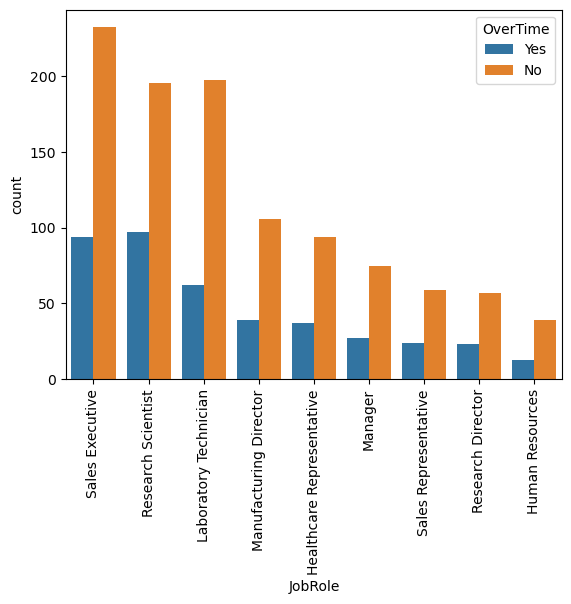

In [124]:
# Checking JobRole vs OverTime
sns.countplot(x='JobRole',hue='OverTime',data=df)
plt.xticks(rotation=90)
plt.show()

Here we see Decresing order.

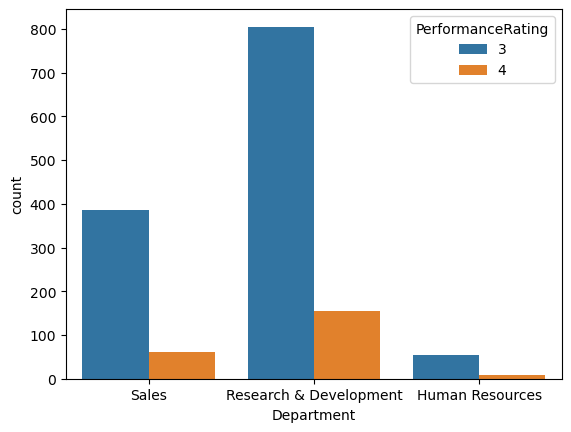

In [125]:
# Checking Department vs PerformanceRating
sns.countplot(x='Department',hue='PerformanceRating',data=df)
plt.show()

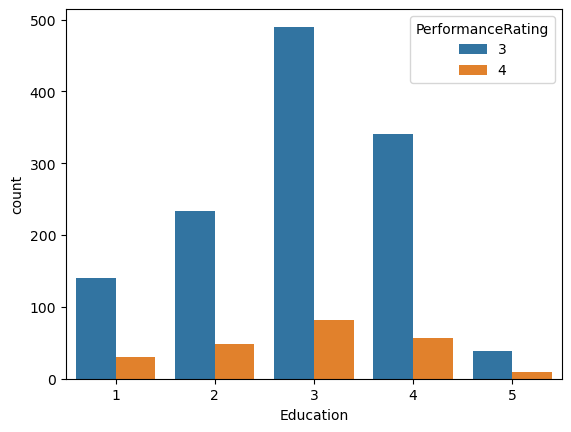

In [126]:
# Checking Education vs PerformanceRating
sns.countplot(x='Education',hue='PerformanceRating',data=df)
plt.show()

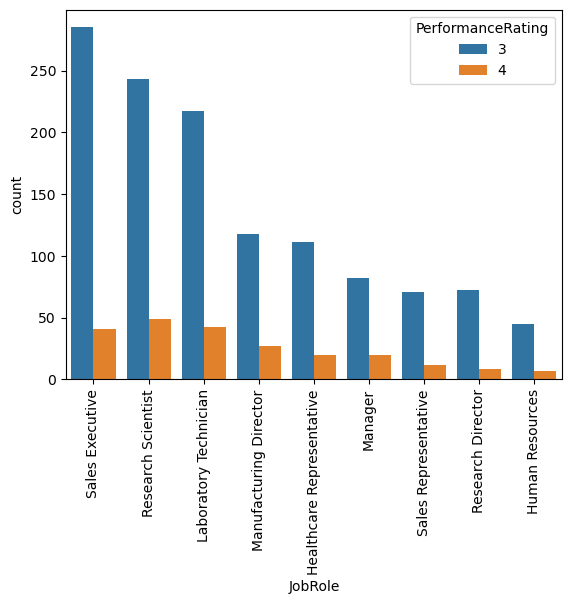

In [127]:
# Checking JobRole vs PerformanceRating
sns.countplot(x='JobRole',hue='PerformanceRating',data=df)
plt.xticks(rotation=90)
plt.show()

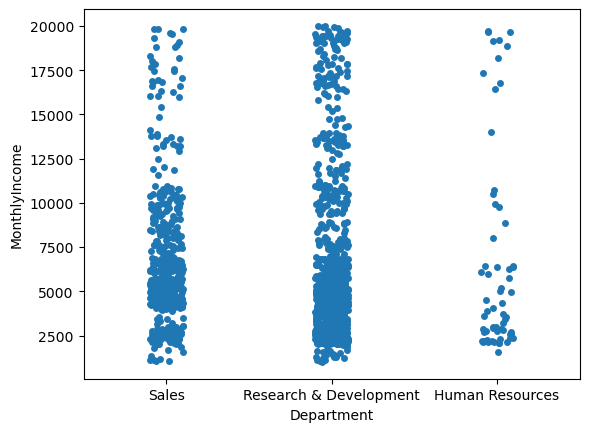

In [128]:
# Checking the relationship Department vs MonthlyIncome
sns.stripplot(x='Department',y='MonthlyIncome',data=df)
plt.show()

Here we see significant relation ship with sales and research & Deveplopment.

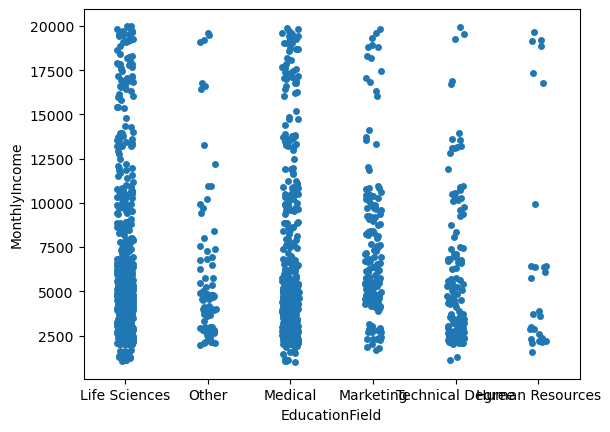

In [129]:
# Checking the relationship EducationField vs MonthlyIncome
sns.stripplot(x='EducationField',y='MonthlyIncome',data=df)
plt.show()

Here we see relationship between Life Sciences and Medical with MonthlyIncome

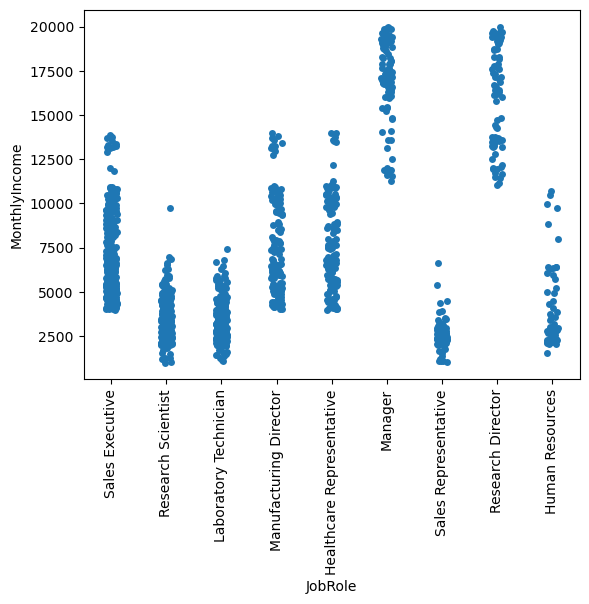

In [130]:
# Checking the relationship JobRole vs MonthlyIncome
sns.stripplot(x='JobRole',y='MonthlyIncome',data=df)
plt.xticks(rotation=90)
plt.show()

We observe that Manager and Reserach Director has MonthlyIncome.

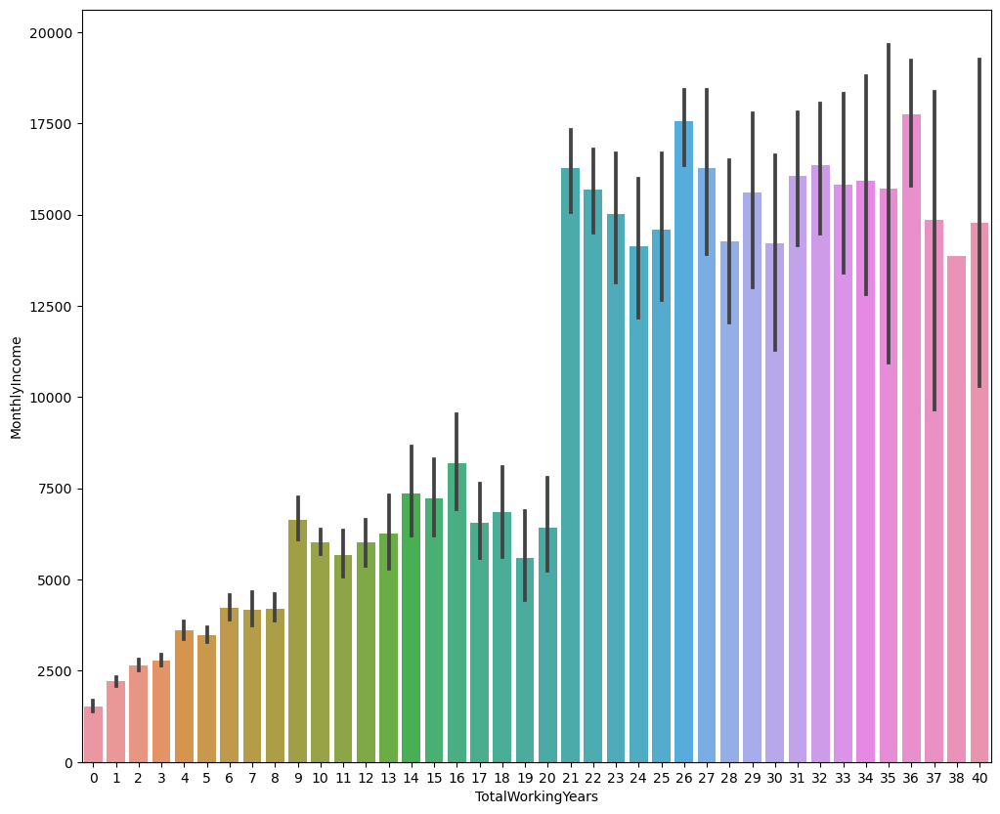

In [131]:
plt.figure(figsize=(12,10))
sns.barplot(x='TotalWorkingYears',y='MonthlyIncome',data=df)
plt.xlabel('TotalWorkingYears')
plt.ylabel('MonthlyIncome')
plt.show()

We can observe taht year is increasing  so MonthlyIncome is also increasing.

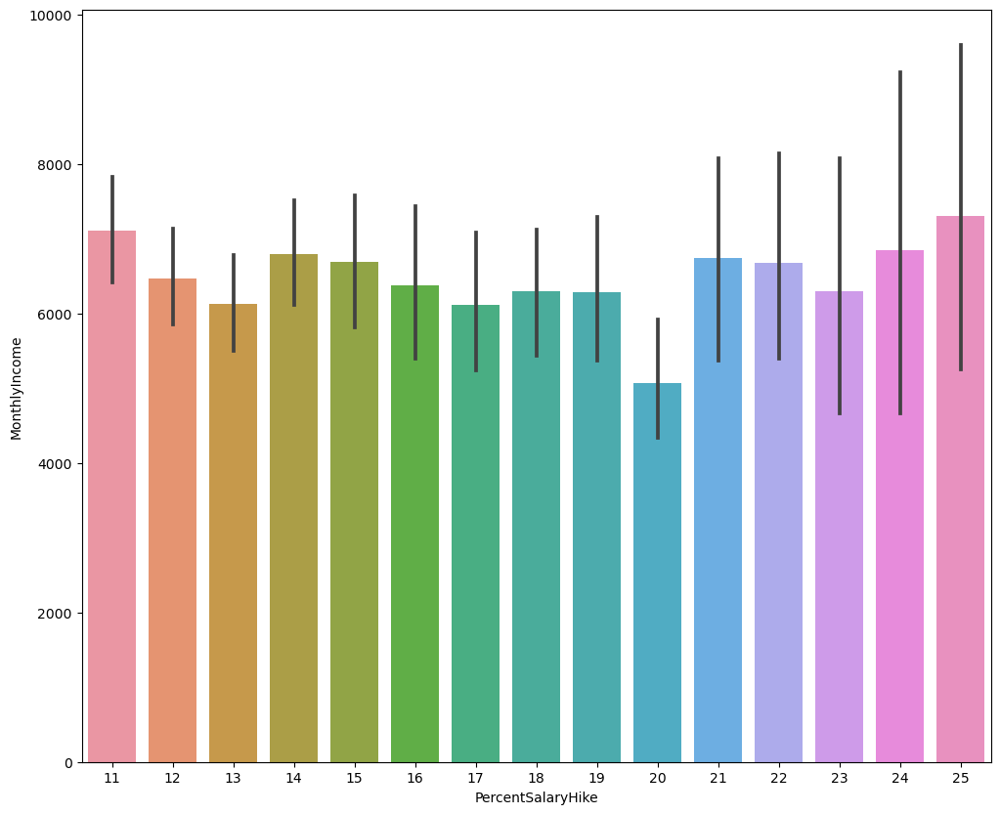

In [132]:
plt.figure(figsize=(12,10))
sns.barplot(x='PercentSalaryHike',y='MonthlyIncome',data=df)
plt.xlabel('PercentSalaryHike')
plt.ylabel('MonthlyIncome')
plt.show()

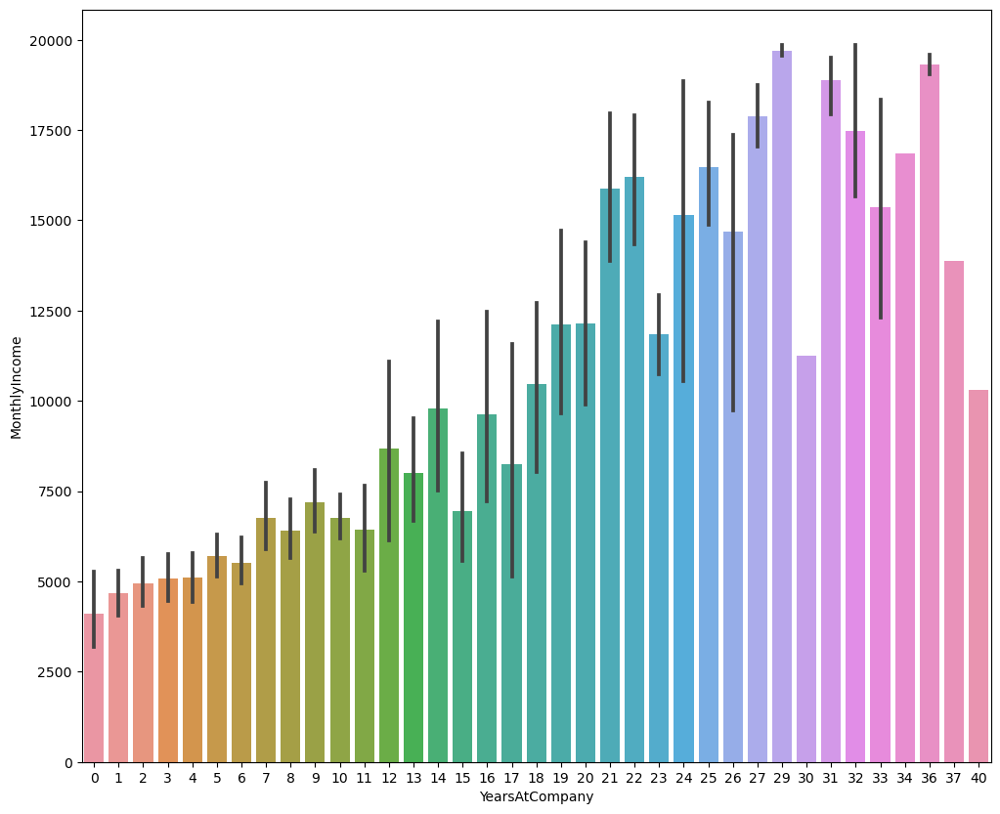

In [133]:
plt.figure(figsize=(12,10))
sns.barplot(x='YearsAtCompany',y='MonthlyIncome',data=df)
plt.xlabel('YearsAtCompany')
plt.ylabel('MonthlyIncome')
plt.show()

We can observe taht YearsAtCompany is increasing so MonthlyIncome is increasing.

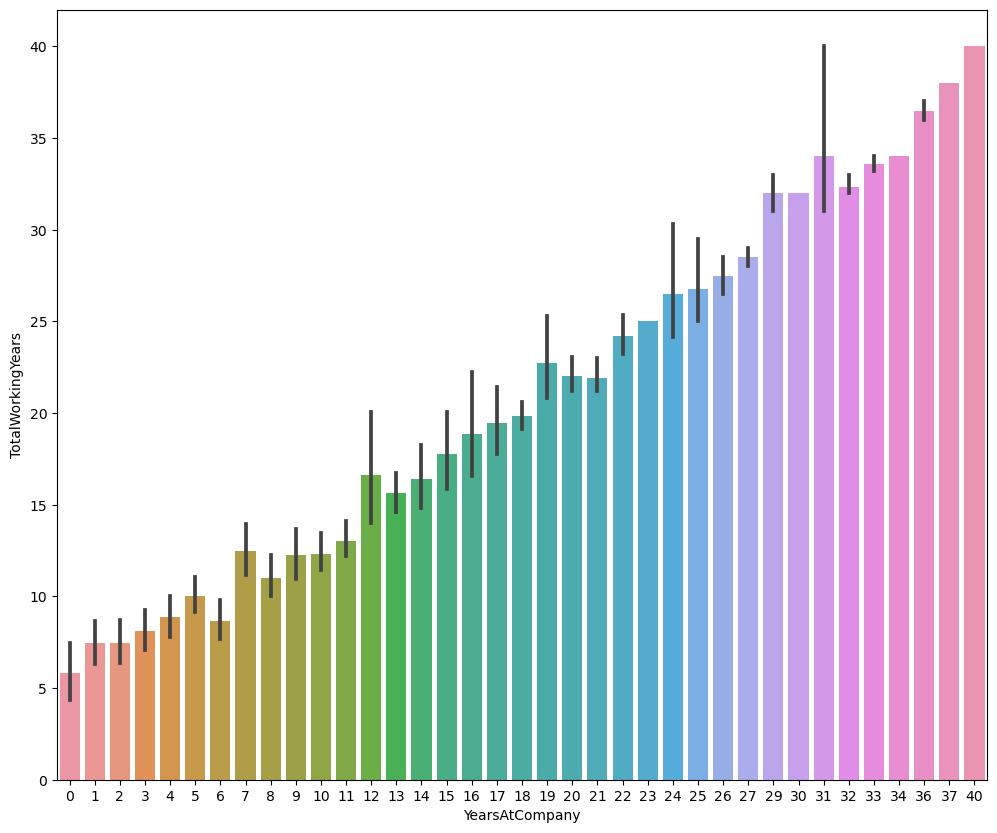

In [134]:
plt.figure(figsize=(12,10))
sns.barplot(x='YearsAtCompany',y='TotalWorkingYears',data=df)
plt.xlabel('YearsAtCompany')
plt.ylabel('TotalWorkingYears')
plt.show()

We can also observe that YearsAtCompany is increasing so TotalworkingYears is increasing.

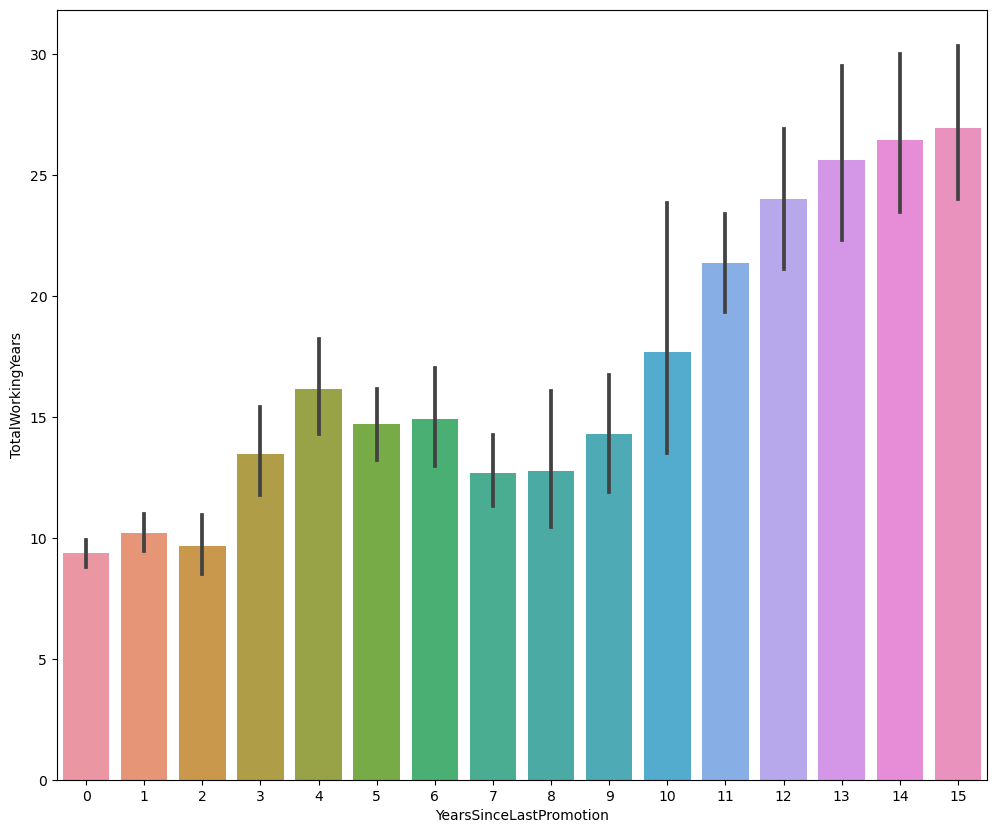

In [135]:
plt.figure(figsize=(12,10))
sns.barplot(x='YearsSinceLastPromotion',y='TotalWorkingYears',data=df)
plt.xlabel('YearsSinceLastPromotion')
plt.ylabel('TotalWorkingYears')
plt.show()

We can observe that YearsSinceLsatPromotion is increasing  so TotalWorkingYears is also increasing 

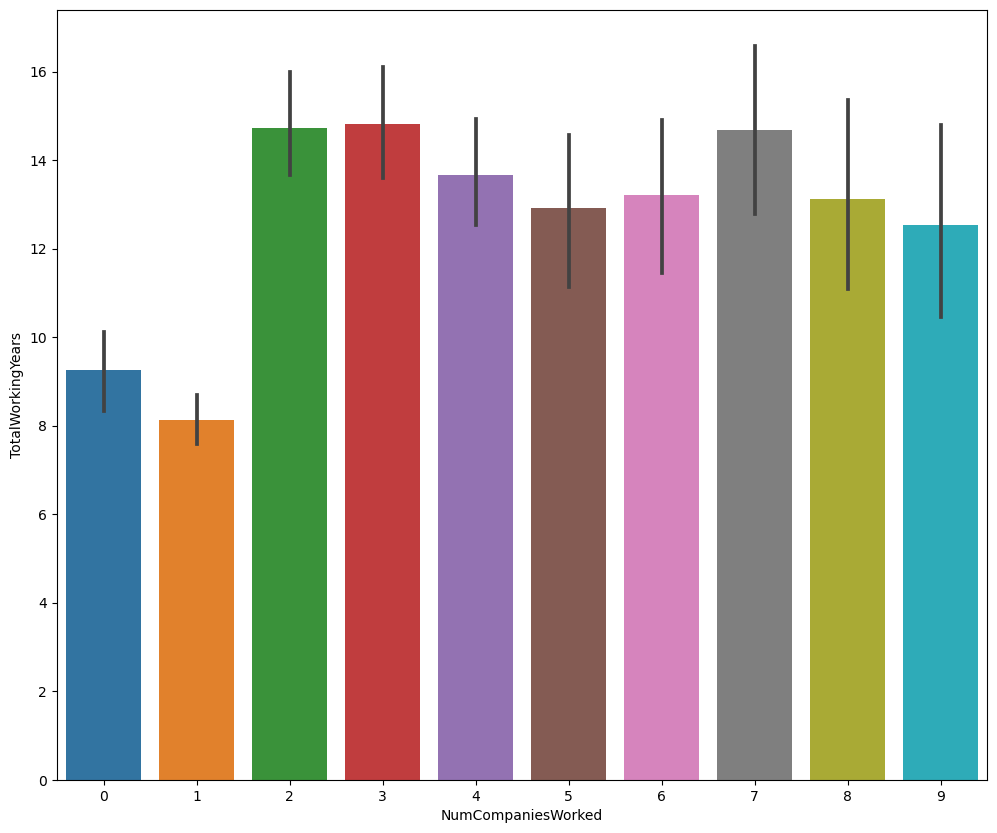

In [136]:
plt.figure(figsize=(12,10))
sns.barplot(x='NumCompaniesWorked',y='TotalWorkingYears',data=df)
plt.xlabel('NumCompaniesWorked')
plt.ylabel('TotalWorkingYears')
plt.show()

## Multivariate Analysis

In [189]:
sns.pairplot(df,hue='Attrition')
plt.show()

## Checking the outliers

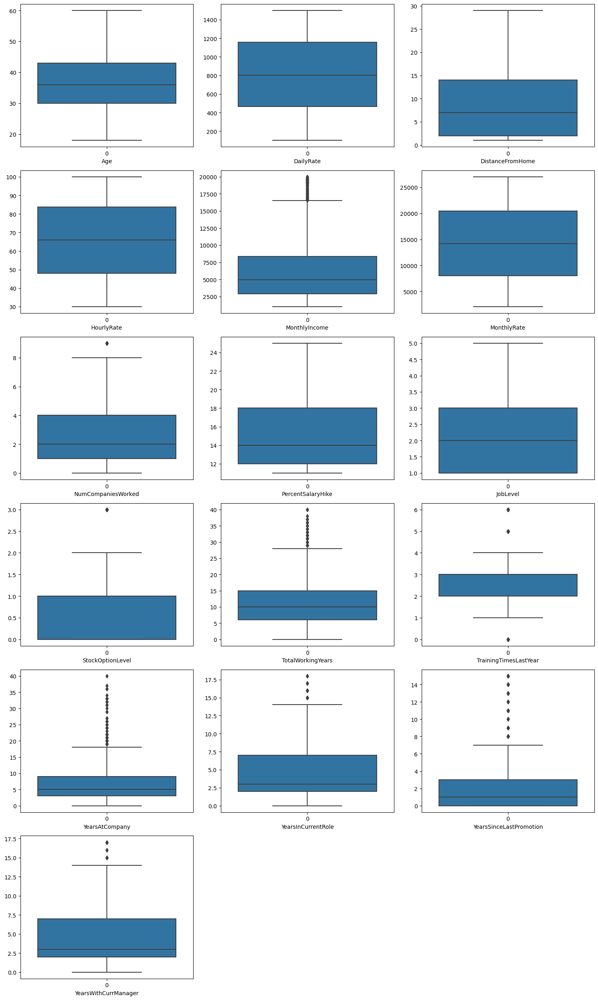

In [138]:
# Checking the outliers using boxplot
plt.figure(figsize=(15,25),facecolor='white')
plotnumber = 1

for col in numerical:
    if plotnumber<=16:
        ax = plt.subplot(6,3,plotnumber)
        sns.boxplot(df[col])
        plt.xlabel(col)
    plotnumber+=1
plt.tight_layout()

#### Features containing outliers
"MonthlyIncome", "NumCompaniesWorked", "PerformanceRating", "StockOptionLevel", "TotalWorkingYears", "TrainingTimesLastYear", "YearsAtCompany", "YearsInCurrentRole", "YearsSinceLastPromotion", "YearsWithCurrManager", "Attrition". 

## Outliers Detection and removel

### Checking outliers using zscore method

In [139]:
# Finding the outliers using zscore mehtod (formula = x - mean/std)
from scipy.stats import zscore
features = df[['MonthlyRate','StockOptionLevel','TotalWorkingYears','TrainingTimesLastYear','YearsAtCompany','YearsInCurrentRole','YearsSinceLastPromotion','YearsWithCurrManager']]

z = np.abs(zscore(features))            # Apply the formula and get the scaled data

df1 = df[(z<3).all(axis=1)]

# Shape of old and New Dataframe
print("Old Data Frame - ",df.shape[0])
print("New Data Frame - ",df1.shape[0])

print("\nData Loss Percentage After removing outliers with zscore method -\n ", ((df.shape[0] - df1.shape[0])/df.shape[0])*100)

Old Data Frame -  1470
New Data Frame -  1387

Data Loss Percentage After removing outliers with zscore method -
  5.646258503401361


It is affordable loss of data now we will check with IQR method

### Checking the outliers by using IQR metohd

In [140]:
# 1st quantile 
Q1 = features.quantile(0.25)

# 3rd quantile
Q3 = features.quantile(0.75)

#
IQR = Q3 - Q1

df2 = df[~((features<(Q1 - 1.5 * IQR)) | (features>(Q3 + 1.5 * IQR))).any(axis=1)]

# Shape of old and New Dataframe
print("Old Data Frame - ",df.shape[0])
print("New Data Frame - ",df2.shape[0])

print("\nData Loss Percentage After removing outliers with zscore method -\n ", ((df.shape[0] - df2.shape[0])/df.shape[0])*100)

Old Data Frame -  1470
New Data Frame -  999

Data Loss Percentage After removing outliers with zscore method -
  32.04081632653061


In [141]:
# reassigning the changed dataframe name to our original dataframe name
df = df1

In [142]:
df.shape

(1387, 31)

We use zscore method because its Loss less data then IQR method

### Checking how the data has been distributed in each column

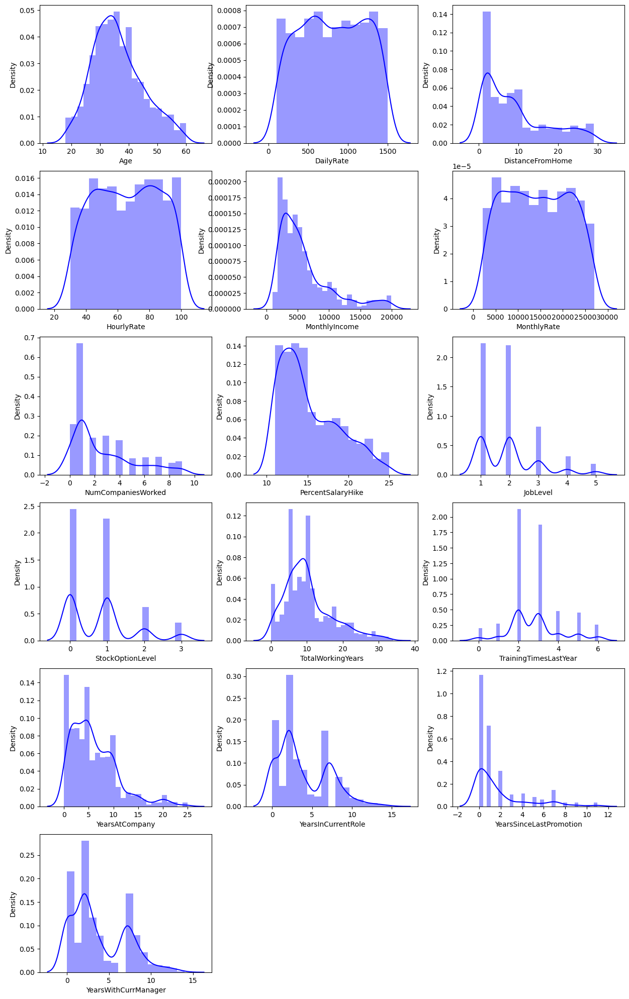

In [143]:
# Let's see how the data gas been distributed each numerical column
plt.figure(figsize=(15,25),facecolor='white')
plotnumber = 1

for col in numerical:
    if plotnumber<=16:
        ax = plt.subplot(6,3,plotnumber)
        sns.distplot(df[col],color='b')
        plt.xlabel(col,fontsize=10)
    plotnumber+=1
plt.show()

## Feature Selection and Engineering

## Checking the skewness 

In [144]:
df[numerical].skew()

Age                        0.472280
DailyRate                 -0.017078
DistanceFromHome           0.954752
HourlyRate                -0.030481
MonthlyIncome              1.544770
MonthlyRate                0.030596
NumCompaniesWorked         1.037715
PercentSalaryHike          0.800592
JobLevel                   1.126075
StockOptionLevel           0.962332
TotalWorkingYears          1.034487
TrainingTimesLastYear      0.577614
YearsAtCompany             1.248623
YearsInCurrentRole         0.726675
YearsSinceLastPromotion    1.756335
YearsWithCurrManager       0.694506
dtype: float64

The columns     'DistanceFromHome','MonthlyIncome','NumCompaniesWorked','PercentSalaryHike','TotalWorkingYears',
'YearsAtCompany,'YearsInCurrentRole','YearsSinceLastPromotion','YearsWithCurrManager' 
these column are skewness need to transform.

### Removing the skewness

**Using np.sqrt transformation method**

In [145]:
df['TotalWorkingYears'] = np.sqrt(df['TotalWorkingYears'])
df['YearsAtCompany'] = np.sqrt(df['YearsAtCompany'])

**Using np.cbrt transformation method**

In [146]:
df['DistanceFromHome'] = np.cbrt(df['DistanceFromHome'])

**Using Powertransformer yeo-johnson transformation method**

In [147]:
from sklearn.preprocessing import PowerTransformer
power = PowerTransformer(method='yeo-johnson')

skew = ['MonthlyIncome','NumCompaniesWorked','PercentSalaryHike',
        'YearsInCurrentRole','YearsSinceLastPromotion',
        'YearsWithCurrManager']

df[skew] = power.fit_transform(df[skew])

In [148]:
df[numerical].skew()

Age                        0.472280
DailyRate                 -0.017078
DistanceFromHome           0.183373
HourlyRate                -0.030481
MonthlyIncome              0.027700
MonthlyRate                0.030596
NumCompaniesWorked         0.016175
PercentSalaryHike          0.112128
JobLevel                   1.126075
StockOptionLevel           0.962332
TotalWorkingYears          0.042345
TrainingTimesLastYear      0.577614
YearsAtCompany             0.075280
YearsInCurrentRole        -0.069631
YearsSinceLastPromotion    0.212301
YearsWithCurrManager      -0.070570
dtype: float64

This looks almsot normal and skewness is also removed.

## Encoding categorical columns

In [149]:
# Encoding categorical columns using OridnalEncoder
from sklearn.preprocessing import OrdinalEncoder
OE = OrdinalEncoder()

for i in df.columns:
    if df.dtypes[i] == 'object':
        df[i] = OE.fit_transform(df[i].values.reshape(-1,1))
        
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1.0,2.0,1102,2.0,1.000000,2,1.0,2,0.0,94,3,2,7.0,4,2.0,0.386674,19479,1.620671,1.0,-1.495549,3,1,0,2.828427,0,1,2.449490,0.290524,-1.073534,0.582177
1,49,0.0,1.0,279,1.0,2.000000,1,1.0,3,1.0,61,2,2,6.0,2,1.0,0.144235,24907,-0.561880,0.0,1.690425,4,4,1,3.162278,3,3,3.162278,1.006575,0.193168,1.018073
2,37,1.0,2.0,1373,1.0,1.259921,2,4.0,4,1.0,92,2,1,2.0,3,2.0,-1.431153,2396,1.273711,1.0,0.193797,3,2,0,2.645751,3,3,0.000000,-1.571814,-1.073534,-1.528426
3,33,0.0,1.0,1392,1.0,1.442250,4,1.0,4,0.0,56,3,1,6.0,3,1.0,-0.814425,23159,-0.561880,1.0,-1.495549,3,3,0,2.828427,3,3,2.828427,1.006575,1.027520,-1.528426
4,27,0.0,2.0,591,1.0,1.259921,1,3.0,1,1.0,40,3,1,2.0,2,1.0,-0.504453,16632,1.764103,0.0,-0.957525,3,4,1,2.449490,3,3,1.414214,-0.390769,0.722874,-0.347871


## Correlation

In [150]:
# Checking the correlation between features vs features and feature vs target
df_corr = df.corr()

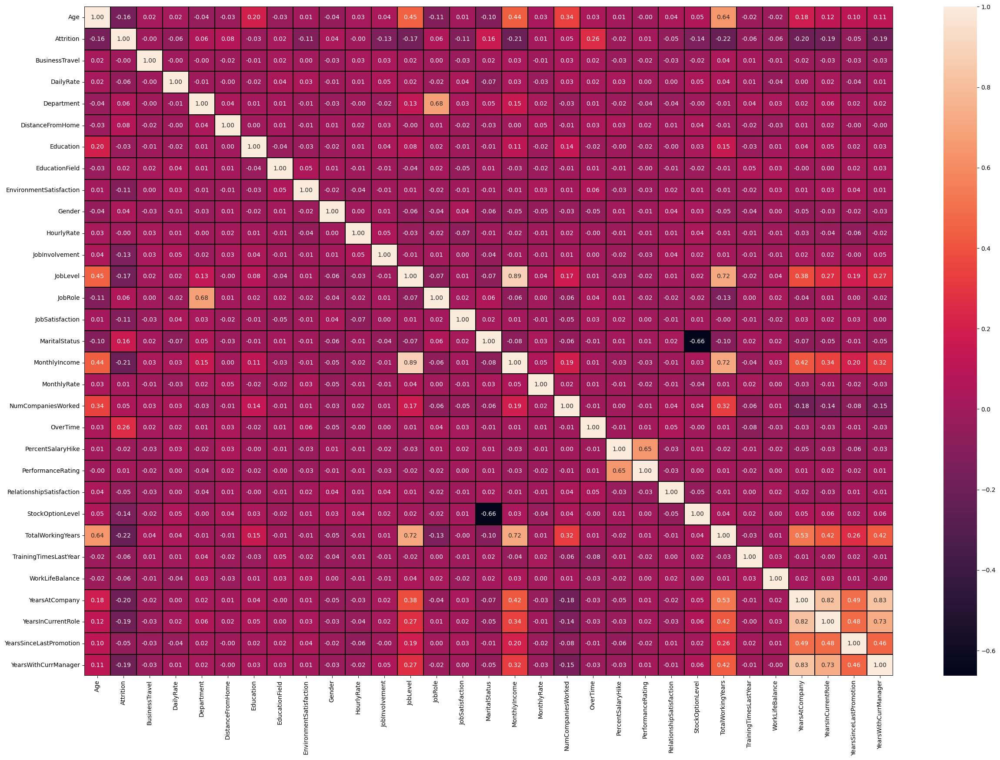

In [151]:
# Visualizing the correlation using heatmap
plt.figure(figsize=(30,20))
sns.heatmap(df_corr, annot=True, annot_kws={'size':10},linewidths=0.1,linecolor='black',fmt='0.2f')
plt.show()

This heamap contains both positive and negative correlation.

 1. Age, JobLevel, MonthlyIncome is highly positively correlated with TotalWorkingYears.
 2. JobLevel is highly positively correlated with the MonthlyIncome.
 3. PercentSalaryHike is highly positively correlated with the column PerformanceRating.

### Correlation between feature vs target

In [152]:
df_corr['Attrition'].drop('Attrition').sort_values(ascending=True)

TotalWorkingYears          -0.218940
MonthlyIncome              -0.207280
YearsAtCompany             -0.197389
YearsInCurrentRole         -0.187047
YearsWithCurrManager       -0.186821
JobLevel                   -0.171968
Age                        -0.159366
StockOptionLevel           -0.136676
JobInvolvement             -0.133957
JobSatisfaction            -0.114206
EnvironmentSatisfaction    -0.112393
WorkLifeBalance            -0.062492
TrainingTimesLastYear      -0.057285
DailyRate                  -0.057220
RelationshipSatisfaction   -0.052344
YearsSinceLastPromotion    -0.050986
Education                  -0.032703
PercentSalaryHike          -0.017523
HourlyRate                 -0.001532
BusinessTravel             -0.001041
PerformanceRating           0.010781
MonthlyRate                 0.014888
EducationField              0.023585
Gender                      0.036252
NumCompaniesWorked          0.047508
Department                  0.063637
JobRole                     0.064283
D

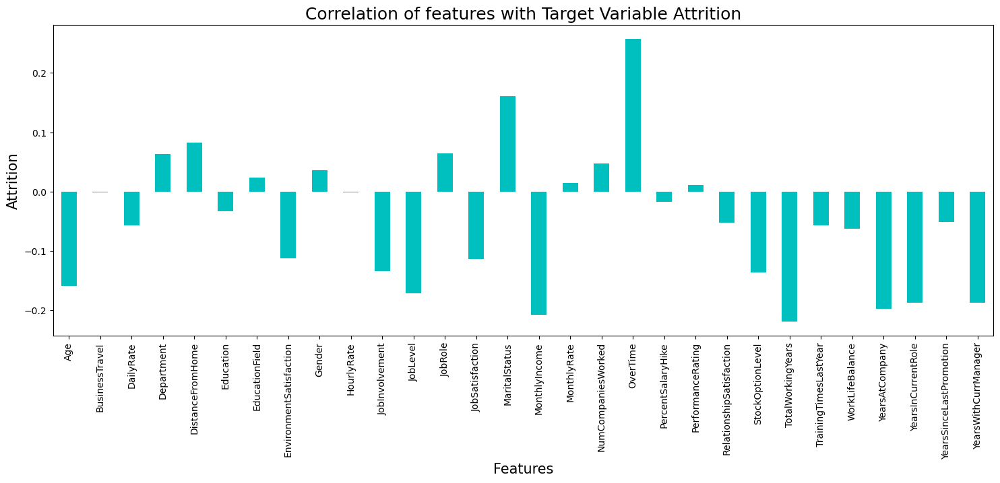

In [153]:
# visualizing correlation of feature vs target using barplot
plt.figure(figsize = (18,6))
df.corr()['Attrition'].drop(['Attrition']).plot(kind='bar',color = 'c')
plt.xlabel('Features',fontsize=15)
plt.ylabel('Attrition',fontsize=15)
plt.title('Correlation of features with Target Variable Attrition',fontsize = 18)
plt.show()

**We can observe the positive  and negative correlatated with the target**

From the above barplot we can notice the postive and negative correlation between the features and target. Here the feature MontlyIncome,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsWithCurrManager has negative correlation with target and Overtime has postive correlation with target.

## Sparating features and targeet

In [154]:
x = df.drop(columns=['Attrition'],axis=1)
y = df['Attrition']

Attrition
0.0    1158
1.0     229
Name: count, dtype: int64


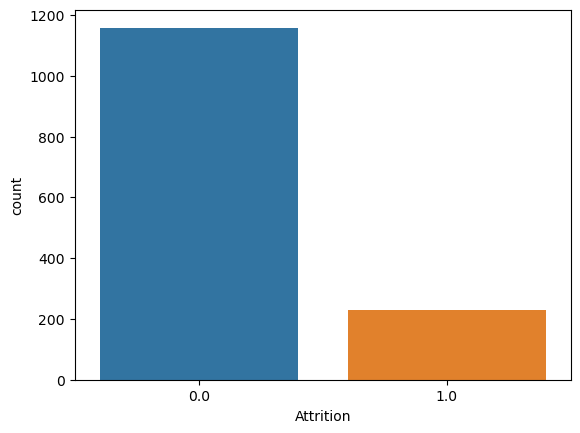

In [155]:
# Checking the count of target columns
print(y.value_counts())
sns.countplot(x=y)
plt.show()

Here we can see that the data is not balanced, since it is classification problem we will balance the data using oversampling method.

## OverSampling

In [156]:
# Oversampling the data
from imblearn.over_sampling import SMOTE

SM = SMOTE()

x1,y1 = SM.fit_resample(x,y)

Attrition
1.0    1158
0.0    1158
Name: count, dtype: int64


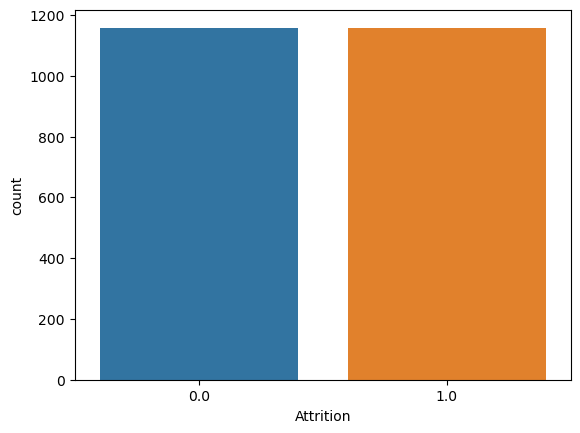

In [157]:
# Checking the count of target columns
print(y1.value_counts())
sns.countplot(x=y1)
plt.show()

Now the data is balanced.

## Feature Scaling using Standard Scalarization

In [158]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

x1 = pd.DataFrame(scaler.fit_transform(x1), columns = x1.columns)

x1.shape

(2316, 30)

We have scaled the data using Standard Scalrization method to overcome the issue of biasness.

## Checking Variance Inflation Factor (VIF)

In [159]:
# Find variance inflation factor in each scaled column i.e. x.shape[1] (1/1-R2)
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif['Feature'] = x1.columns
vif['VIF values'] = [variance_inflation_factor(x1.values,i) for i in range(len(x1.columns))]

vif

,Feature,VIF values
0,Age,1.984184
1,BusinessTravel,1.011887
2,DailyRate,1.053912
3,Department,2.371965
4,DistanceFromHome,1.031041
5,Education,1.087156
6,EducationField,1.042090
7,EnvironmentSatisfaction,1.066159
8,Gender,1.025746
9,HourlyRate,1.030903


By Checking VIF values we can find the features causing multicollinerity probelm. Here we can find the feature YearsAtCompany have VIF value greater than 5 which means they have high correlation with other features. We will drop the columns.

In [160]:
# Drop the columns YearsAtCompany for reduce multicollinearity
x1 = x1.drop(columns=['YearsAtCompany'],axis=1)

In [161]:
# Find variance inflation factor in each scaled column i.e. x.shape[1] (1/1-R2)

vif = pd.DataFrame()
vif['Feature'] = x1.columns
vif['VIF values'] = [variance_inflation_factor(x1.values,i) for i in range(len(x1.columns))]

vif

,Feature,VIF values
0,Age,1.983964
1,BusinessTravel,1.009724
2,DailyRate,1.052958
3,Department,2.370583
4,DistanceFromHome,1.029097
5,Education,1.086794
6,EducationField,1.038170
7,EnvironmentSatisfaction,1.066118
8,Gender,1.025471
9,HourlyRate,1.030403


So, we have solved multicollinearity issue, We can now move ahead fro model building.

## Modelling

In [162]:
# Models
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
import xgboost as xgb

# Metrics
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.metrics import roc_auc_score, roc_curve, auc

# Model Selection
from sklearn.model_selection import train_test_split, cross_val_score

### Finding Best Random state

In [163]:
maxAccu = 0
maxRs = 0

for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x1,y1,test_size=0.25, random_state=i)
    RFC = RandomForestClassifier()
    RFC.fit(x_train,y_train)
    y_pred = RFC.predict(x_test)
    acc = accuracy_score(y_test,y_pred)
    if acc>maxAccu:
        maxAccu = acc
        maxRs = i
        
print("Best accuracy is ", maxAccu*100,"at random_state", maxRs)  

Best accuracy is  96.02763385146805 at random_state 160


### Creating train test split

In [164]:
x_train,x_test,y_train,y_test = train_test_split(x1,y1,test_size=0.25,random_state=maxRs)
print('The shape of x_train ',x_train.shape)
print('The shape of y_train ',y_train.shape)
print('The shape of x_test  ',x_test.shape)
print('The shape of y_test  ',y_test.shape)

The shape of x_train  (1737, 29)
The shape of y_train  (1737,)
The shape of x_test   (579, 29)
The shape of y_test   (579,)


### Applying all Classification Model

In [170]:
LR  = LogisticRegression()
DT  = DecisionTreeClassifier()
ET  = ExtraTreeClassifier()
RFC = RandomForestClassifier()
BC  = BaggingClassifier()
ABC = AdaBoostClassifier()
GBC = GradientBoostingClassifier()
SVM = SVC(probability=True)
XGB = xgb.XGBClassifier()

models = {'LogisticRegression':LR,'DecisionTree':DT,'ExtraTree':ET,'RandomForest':RFC,
         'Bagging':BC,'AdaBoost':ABC,'GradientBoosting':GBC,'SVC':SVM,'XGBoost':XGB}

In [172]:
for name,model in models.items():
    model.fit(x_train,y_train)
    y_pred = model.predict(x_test)
    acc_score = accuracy_score(y_test, y_pred)
    print('\n\033[1m'+'Classification ML Algorithm model is',name,'\033[0m\n')

    print('\033[1m'+'Accuracy Score :'+'\033[0m', acc_score)
    
    print('\n\033[1m'+'Confusion matrix :'+'\033[0m \n',confusion_matrix(y_test, y_pred))
    
    print('\n\033[1m'+'Classification Report :'+'\033[0m \n',classification_report(y_test, y_pred))
    
    print('****************************************************************************************')


Classification ML Algorithm model is LogisticRegression 

Accuracy Score : 0.8842832469775475

Confusion matrix : 
 [[251  39]
 [ 28 261]]

Classification Report : 
               precision    recall  f1-score   support

         0.0       0.90      0.87      0.88       290
         1.0       0.87      0.90      0.89       289

    accuracy                           0.88       579
   macro avg       0.88      0.88      0.88       579
weighted avg       0.88      0.88      0.88       579

****************************************************************************************

Classification ML Algorithm model is DecisionTree 

Accuracy Score : 0.8601036269430051

Confusion matrix : 
 [[234  56]
 [ 25 264]]

Classification Report : 
               precision    recall  f1-score   support

         0.0       0.90      0.81      0.85       290
         1.0       0.82      0.91      0.87       289

    accuracy                           0.86       579
   macro avg       0.86      0.86     

# Cross Validation

In [178]:
for name,model in models.items():
    score = cross_val_score(model, x1, y1, cv =5)

    print('\n\033[1m'+'Cross Validation Score', name, ':'+'\033[0m\n')
    print("Score :" ,score)
    print("Mean Score :",score.mean())
        
    final = acc_score - score.mean()
    print('\nDifferent between Accuracy vs Cross Val Score: ',final)
    
    print('\n***********************************************************************************')


Cross Validation Score LogisticRegression :

Score : [0.73060345 0.8812095  0.88984881 0.86825054 0.88984881]
Mean Score : 0.8519522231324942

Different between Accuracy vs Cross Val Score:  0.0893258424979031

***********************************************************************************

Cross Validation Score DecisionTree :

Score : [0.66163793 0.89416847 0.8812095  0.8336933  0.89416847]
Mean Score : 0.8329755343710433

Different between Accuracy vs Cross Val Score:  0.10830253125935396

***********************************************************************************

Cross Validation Score ExtraTree :

Score : [0.66810345 0.86393089 0.81857451 0.83153348 0.81857451]
Mean Score : 0.8001433678409177

Different between Accuracy vs Cross Val Score:  0.14113469778947962

***********************************************************************************

Cross Validation Score RandomForest :

Score : [0.64655172 0.98488121 0.96976242 0.9762419  0.98056156]
Mean Score : 0.91159

## ROC curve and AUC score

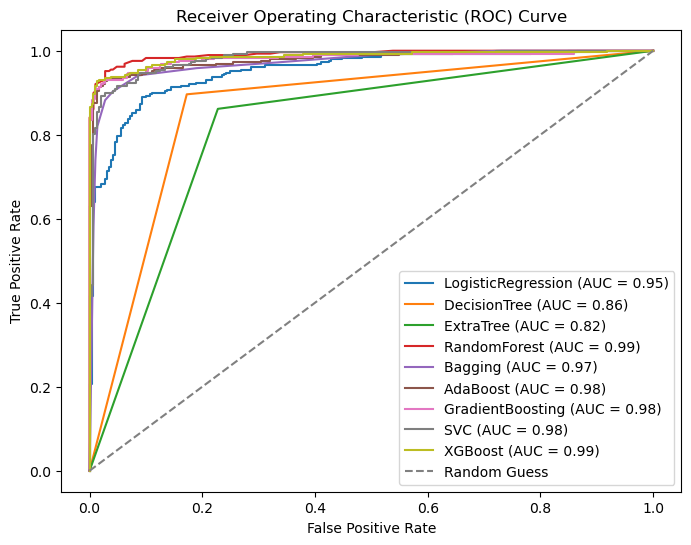

In [180]:
# Calculate the ROC curves and AUC scores for each model
plt.figure(figsize=(8,6))
for name,model in models.items():                 # Reading key and values from the items
    model.fit(x_train, y_train)                   # Each Model traning
    y_prob = model.predict_proba(x_test)[:, 1]    # Predict Prob of each model
    fpr, tpr,_ =roc_curve(y_test,y_prob)          # Finding False and True positive rate(' - ' is threshold)
    roc_auc = auc(fpr, tpr)                       # auc score of each model captured
    
    # Plot the ROC curve
    plt.plot(fpr, tpr, label = '{} (AUC = {:.2f})'.format(name, roc_auc))
    
# Add Labels and legend to the plot
plt.plot([0,1], [0,1], linestyle='--',color='grey', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')

# Shiw the plot
plt.show()

### RandomForest is out best model.

**We can see that RanodomForest gives less error between accuracy score and CrossValidation.**

Score : [0.64655172 0.98488121 0.96976242 0.9762419  0.98056156]

Mean Score : 0.9115997616742385

Different between Accuracy vs Cross Val Score:  0.02967830395615878

## Hyper Parameter Tuning : GridSearchCV

### Tune the parameter with RandomForestClassifier model

In [182]:
RFC.get_params().keys()

dict_keys(['bootstrap', 'ccp_alpha', 'class_weight', 'criterion', 'max_depth', 'max_features', 'max_leaf_nodes', 'max_samples', 'min_impurity_decrease', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'n_estimators', 'n_jobs', 'oob_score', 'random_state', 'verbose', 'warm_start'])

In [184]:
from sklearn.model_selection import GridSearchCV

param_grid = {  'bootstrap': [True], 'max_depth': [5, 10,20,40,50, None], 
              'max_features': ['auto', 'log2'], 
              'criterion':['gini','entropy'],
              'n_estimators': [5, 10, 15 ,25,50,100]}

GCV = GridSearchCV(estimator = RFC, param_grid=param_grid)

GCV.fit(x_train,y_train)

print('Best estimator : ',GCV.best_estimator_)
print('\n')
print('Best score : ',GCV.best_score_)

Best estimator :  RandomForestClassifier(max_depth=20, max_features='log2', n_estimators=50)


Best score :  0.921704925635165


## Final Model

In [185]:
model = RandomForestClassifier(max_depth=20, max_features='log2', n_estimators=50)
model.fit(x_train,y_train)

y_pred=model.predict(x_test)

print('\033[1m'+' Final Model :' +'\033[0m')
print('Accuracy Score',accuracy_score(y_test,y_pred))
print('\nConfusion matrix :\n',confusion_matrix(y_test, y_pred))
print('\nClassification report :\n',classification_report(y_test, y_pred))

 Final Model :
Accuracy Score 0.9568221070811744

Confusion matrix :
 [[281   9]
 [ 16 273]]

Classification report :
               precision    recall  f1-score   support

         0.0       0.95      0.97      0.96       290
         1.0       0.97      0.94      0.96       289

    accuracy                           0.96       579
   macro avg       0.96      0.96      0.96       579
weighted avg       0.96      0.96      0.96       579



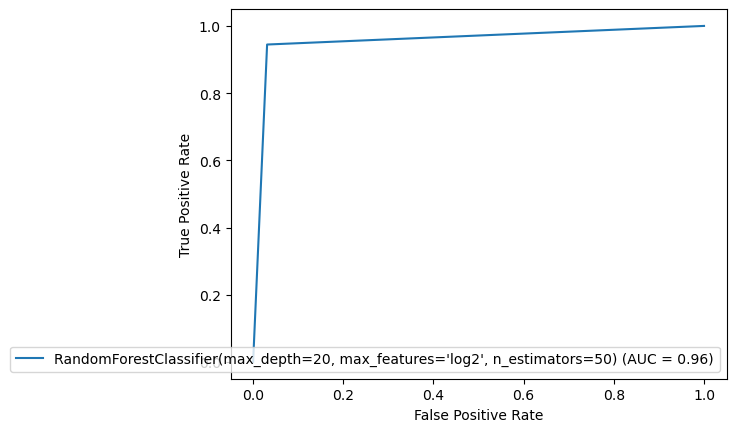

In [186]:
from sklearn import metrics

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name = model)
display.plot()

Here we have plotted the ROC curve for the final model and the AUC value for the best model is 100%

## Saving the model

In [187]:
import joblib
joblib.dump(model,'HR_Analytics_Project.pkl')

['HR_Analytics_Project.pkl']

## Predicting the saved model

In [188]:
# Let's load the saved model and get the predictions
model = joblib.load("HR_Analytics_Project.pkl")

# Prediction 
prediction = model.predict(x_test)
prediction

array([1., 0., 0., 1., 1., 0., 0., 1., 1., 1., 0., 1., 1., 1., 0., 1., 0.,
       1., 0., 1., 0., 1., 0., 0., 1., 0., 1., 1., 0., 1., 0., 1., 1., 0.,
       0., 1., 1., 1., 1., 1., 0., 0., 0., 0., 1., 0., 1., 1., 0., 0., 1.,
       1., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 1.,
       1., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 1., 1., 0., 0., 0., 0.,
       0., 1., 1., 0., 1., 0., 0., 0., 1., 0., 1., 1., 0., 1., 0., 0., 1.,
       0., 1., 0., 0., 0., 1., 0., 1., 1., 0., 1., 0., 0., 0., 0., 1., 0.,
       0., 0., 1., 1., 0., 1., 0., 0., 0., 1., 1., 1., 0., 1., 1., 1., 0.,
       1., 1., 0., 1., 1., 0., 1., 0., 1., 0., 0., 0., 1., 1., 0., 0., 0.,
       0., 1., 0., 1., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 1., 1., 1.,
       0., 0., 0., 0., 1., 0., 1., 1., 1., 1., 0., 1., 1., 0., 1., 1., 0.,
       1., 1., 1., 0., 0., 0., 0., 1., 1., 0., 0., 0., 1., 1., 1., 0., 0.,
       1., 0., 1., 1., 0., 1., 1., 1., 0., 0., 1., 1., 0., 1., 0., 0., 1.,
       0., 0., 0., 0., 1.